In [1]:
# ==========================================
# Cell 1: Imports and Setup
# ==========================================
import os
import pickle
import numpy as np
from astropy.cosmology import FlatLambdaCDM
from astropy.units import Quantity
from astropy.table import Table

import slsim.Sources as sources
import slsim.Deflectors as deflectors
from slsim.Lenses.lens_pop import LensPop

import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

# Define output directory for the pickled objects
output_dir = "../saved_objects"
os.makedirs(output_dir, exist_ok=True)

In [2]:
# ==========================================
# Cell 2: Cosmology & Load Pre-computed Catalogs
# ==========================================
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

# Define Sky Areas (Used by slsim to calculate population densities)
sky_area_galaxy = Quantity(50, "deg2")
sky_area_quasar = Quantity(24.0, "deg2")

print("Loading pre-computed SkyPy and Quasar catalogs...")
red_galaxy_catalog = Table.read(f'../catalogs/skypy_red_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
blue_galaxy_catalog = Table.read(f'../catalogs/skypy_blue_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
all_galaxy_catalog = Table.read(f'../catalogs/skypy_all_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')
quasar_host_catalog = Table.read(f'../catalogs/agile_qsos.fits', format='fits')
print("Catalogs loaded successfully.")

Loading pre-computed SkyPy and Quasar catalogs...
Catalogs loaded successfully.


In [3]:
quasar_host_catalog[:5]

ps_mag_u,ps_mag_g,ps_mag_r,ps_mag_i,ps_mag_z,ps_mag_y,z,mag_u,mag_g,mag_r,mag_i,mag_z,mag_y,w0,w1,angular_size_0,angular_size_1,e0_1,e0_2,e1_1,e1_2,n_sersic_0,n_sersic_1,physical_size,black_hole_mass_exponent,log_L_bol,log_lambda_Edd
mag,mag,mag,mag,mag,mag,,mag,mag,mag,mag,mag,mag,,,arcsec,arcsec,,,,,,,kpc,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
20.344694355832186,20.100516232988927,19.74808117237122,19.734139102620553,19.69769378589522,19.53570023377086,1.0538777112960815,24.335005875452932,23.99059933419829,23.58811950737739,23.086240234552807,22.480760784733178,22.190382262519663,0.867277876827329,0.13272212317267099,0.30594924092292786,0.17215263843536377,-0.2566332044665686,-0.146260256746322,-0.46090987220422774,-0.2626815044671534,1.0,2.0,2.4791670110882205,7.3377487740959335,45.9335514819009,0.4954321626874023
26.578406305989034,25.746231042188157,25.527723704138012,25.319814792363353,25.037706532953244,24.78490144819248,2.371891975402832,29.277317650423903,27.04238303338788,26.170726554038165,25.729954413769224,25.38429536396262,25.007109453302874,0.9816476576957203,0.018352342304279772,0.5741918087005615,0.20241805911064148,-0.11705693313419521,-0.05085266065850358,-0.10211439833461515,-0.044361224131033605,1.0,2.0,4.684803176966269,6.980110808423868,44.57591841515982,-0.5045629383816124
30.243803953568786,29.914233495731043,29.782922984599256,29.861581607538163,29.765544027129913,29.710965606049022,0.8843787908554077,25.316655384919187,25.254778673940677,25.136268643537417,24.5905788254301,24.468934904804183,24.333088176623157,0.9971570438493281,0.002842956150671825,0.1143917366862297,0.021279077976942062,0.10211660807739795,0.2995030572777318,0.05980675705520378,0.17541031690284592,1.0,2.0,0.8867112799896986,4.440523067121883,41.613713431395745,-0.9271801808437017
23.600021362637637,22.87670392629782,22.59446487671214,22.544284505393005,22.32203134058478,22.158822021329687,2.5721309185028076,25.117573040786393,23.510471284993738,23.113690725781563,22.91085284348712,22.922162683803183,22.756841575098672,0.9742765766821061,0.02572342331789391,0.46181315183639526,0.29969537258148193,0.03161444490411162,-0.45528747060825764,0.03440287263785483,-0.495444310740053,1.0,2.0,3.704392620354286,7.217427801967883,45.63347294838,0.3156746012945568
27.095985115720502,26.723099694741105,26.71988135503599,26.54655536154023,26.698477072631107,26.40766268824798,0.5916422605514526,26.02013891750699,25.60273584499118,24.719307192024278,24.248337805599416,24.14448295665501,24.001362128767813,0.951146433221824,0.04885356677817596,0.25850507616996765,0.03483652323484421,-0.20959248985775566,-0.10410924642389473,-0.06143307301300396,-0.03051517228135682,1.0,2.0,1.7169638004442542,4.368616307996224,42.60215098282475,0.13316412971096536


In [4]:
# ==========================================
# Cell 3: Define Source and Deflector Populations
# ==========================================
kwargs_deflector_cut = {"band": "i", "band_min": 19, "band_max": 24, "z_min": 0.01, "z_max": 2.5}
kwargs_source_galaxy_cut = {"band": "i", "band_max": 26, "z_min": 0.01, "z_max": 5.0}
kwargs_source_quasar_cut = {"band": "i", "band_max": 26, "z_min": 0.01, "z_max": 5.0}

lens_galaxy_pop = deflectors.EllipticalLensGalaxies(
    galaxy_list=red_galaxy_catalog,
    kwargs_cut=kwargs_deflector_cut,
    gamma_pl={"mean": 2.0, "std_dev": 0.16},
    cosmo=cosmo,
    sky_area=sky_area_galaxy,
    kwargs_mass2light={}
)

source_galaxy_pop = sources.Galaxies(
    galaxy_list=blue_galaxy_catalog, 
    kwargs_cut=kwargs_source_galaxy_cut, 
    cosmo=cosmo, 
    sky_area=sky_area_galaxy, 
    catalog_type="skypy"
)

field_galaxy_pop = sources.Galaxies(
    galaxy_list=all_galaxy_catalog, 
    kwargs_cut=kwargs_source_galaxy_cut, 
    cosmo=cosmo, 
    sky_area=sky_area_galaxy, 
    catalog_type="skypy"
)

source_quasar_host_pop = sources.PointPlusExtendedSources(
    point_plus_extended_sources_list=quasar_host_catalog, 
    cosmo=cosmo, 
    sky_area=sky_area_quasar, 
    point_source_type="quasar", 
    extended_source_type="double_sersic", 
    kwargs_cut=kwargs_source_quasar_cut
)

In [ ]:
# ==========================================
# Cell 4: Generate a Balanced Dataset of Lensed Quasars
# ==========================================
import os
import pickle
from astropy.units import Quantity

TARGET_PER_CLASS = 25_000 # 50,000 total lenses (25k doubles, 25k quads)

lensed_quasars_pop = LensPop(
    deflector_population=lens_galaxy_pop,
    source_population=source_quasar_host_pop,
    cosmo=cosmo,
    sky_area=Quantity(40000, "deg2"), # Scaled up to draw enough samples
)

kwargs_lens_cut = {
    "min_image_separation": 1.0,  # arcseconds
    "second_brightest_image_cut": {"i": 26},
}

double_lenses = []
quad_lenses = []
edge_case_triples = [] # Save these separately for robustness testing later

print(f"Drawing batches until we reach {TARGET_PER_CLASS} Doubles and {TARGET_PER_CLASS} Quads...")

while len(double_lenses) < TARGET_PER_CLASS or len(quad_lenses) < TARGET_PER_CLASS:
    # Draw a batch
    batch = lensed_quasars_pop.draw_population(kwargs_lens_cuts=kwargs_lens_cut, speed_factor=10000)
    
    # Sort the batch into our buckets
    for lens in batch:
        # image_number property returns a list of image counts for each source
        n_images = lens.image_number[0]
        
        if n_images == 2 and len(double_lenses) < TARGET_PER_CLASS:
            double_lenses.append(lens)
            
        elif n_images == 4 and len(quad_lenses) < TARGET_PER_CLASS:
            quad_lenses.append(lens)
            
        elif n_images == 3:
            edge_case_triples.append(lens)
            
    print(f"Progress -> Doubles: {len(double_lenses)}/{TARGET_PER_CLASS} | Quads: {len(quad_lenses)}/{TARGET_PER_CLASS}")

print(f"\nFinished drawing! Collected {len(double_lenses)} Doubles and {len(quad_lenses)} Quads.")
print(f"Also collected {len(edge_case_triples)} edge-case triples for separate testing.")

# 1. Save the Doubles
doubles_filename = f"lensed_quasars_doubles_{len(double_lenses)}.pkl"
with open(os.path.join(output_dir, doubles_filename), "wb") as f:
    pickle.dump(double_lenses, f)
print(f"✅ Doubles saved to {os.path.join(output_dir, doubles_filename)}")

# 2. Save the Quads
quads_filename = f"lensed_quasars_quads_{len(quad_lenses)}.pkl"
with open(os.path.join(output_dir, quads_filename), "wb") as f:
    pickle.dump(quad_lenses, f)
print(f"✅ Quads saved to {os.path.join(output_dir, quads_filename)}")

# 3. Save the Triples (Edge Cases) --> Visually these are doubles but the third image is very faint, so they could be used to test the robustness of our models later on
triples_filename = f"lensed_quasars_triples_{len(edge_case_triples)}.pkl"
with open(os.path.join(output_dir, triples_filename), "wb") as f:
    pickle.dump(edge_case_triples, f)
print(f"✅ Triples saved to {os.path.join(output_dir, triples_filename)}")

Drawing batches until we reach 25000 Doubles and 25000 Quads...
Progress -> Doubles: 1225/25000 | Quads: 31/25000
Progress -> Doubles: 2522/25000 | Quads: 70/25000
Progress -> Doubles: 3823/25000 | Quads: 106/25000
Progress -> Doubles: 5078/25000 | Quads: 137/25000
Progress -> Doubles: 6381/25000 | Quads: 181/25000
Progress -> Doubles: 7670/25000 | Quads: 219/25000
Progress -> Doubles: 8948/25000 | Quads: 254/25000
Progress -> Doubles: 10254/25000 | Quads: 281/25000
Progress -> Doubles: 11501/25000 | Quads: 321/25000
Progress -> Doubles: 12781/25000 | Quads: 355/25000
Progress -> Doubles: 14085/25000 | Quads: 389/25000
Progress -> Doubles: 15395/25000 | Quads: 418/25000
Progress -> Doubles: 16702/25000 | Quads: 467/25000
Progress -> Doubles: 17974/25000 | Quads: 501/25000
Progress -> Doubles: 19249/25000 | Quads: 530/25000
Progress -> Doubles: 20516/25000 | Quads: 567/25000
Progress -> Doubles: 21814/25000 | Quads: 604/25000
Progress -> Doubles: 23081/25000 | Quads: 630/25000
Progress 

In [35]:
# combine and save 25k doubles + 25k quads into one file for easy loading later
balanced_lenses = double_lenses[:TARGET_PER_CLASS] + quad_lenses[:TARGET_PER_CLASS]
balanced_filename = f"lensed_quasars_balanced_{len(balanced_lenses)}.pkl"
with open(os.path.join(output_dir, balanced_filename), "wb") as f:
    pickle.dump(balanced_lenses, f)
print(f"✅ Balanced dataset (25k Doubles + 25k Quads) saved to {os.path.join(output_dir, balanced_filename)}")

✅ Balanced dataset (25k Doubles + 25k Quads) saved to ../saved_objects/lensed_quasars_balanced_50000.pkl


## Vizualize

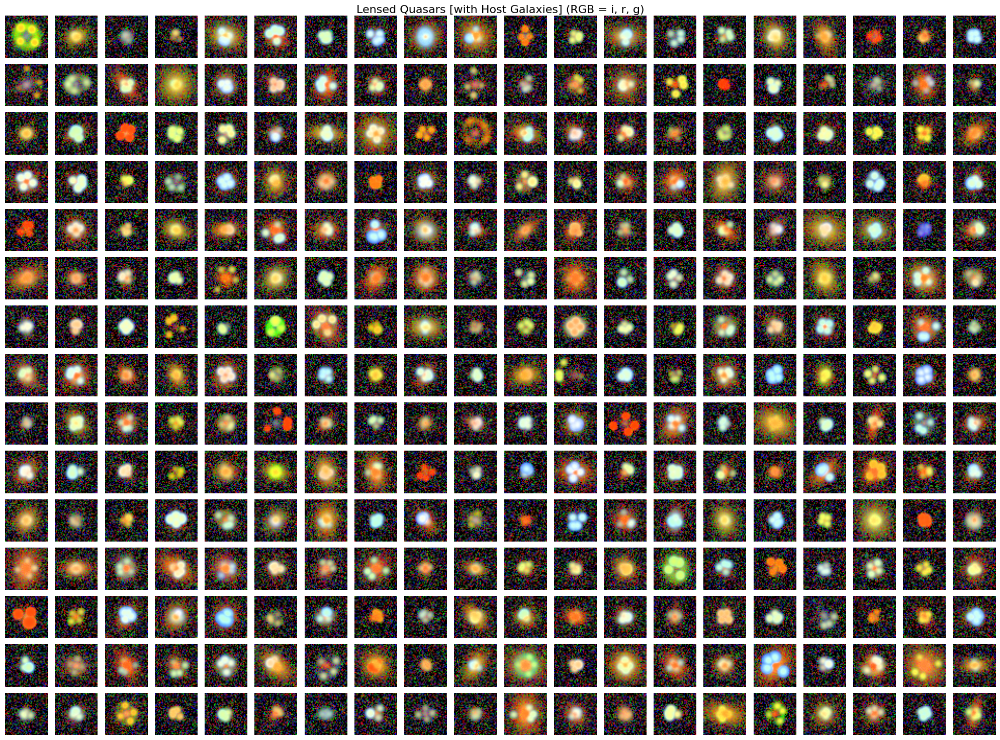

In [37]:
from utils import plot_montage

plot_montage(quad_lenses[:300], number_to_plot=300, num_cols=20, random_seed=42,
            plot_title="Lensed Quasars [with Host Galaxies] (RGB = i, r, g)", coadd_years=1);

In [ ]:
# # ==========================================
# # Cell 4: Generate Lensed Quasars
# # ==========================================
# MAX_LENSES = 50_000

# lensed_quasars_pop = LensPop(
#     deflector_population=lens_galaxy_pop,
#     source_population=source_quasar_host_pop,
#     cosmo=cosmo,
#     sky_area=Quantity(40000, "deg2"), # Scaled up to draw enough samples
# )

# kwargs_lens_cut = {
#     "min_image_separation": 1.0,  # arcseconds
#     "second_brightest_image_cut": {"i": 26},
# }

# print("Drawing Lensed Quasars...")
# lensed_quasars = []
# while True:
#     lensed_quasars_new = lensed_quasars_pop.draw_population(kwargs_lens_cuts=kwargs_lens_cut, speed_factor=10000)
#     lensed_quasars.extend(lensed_quasars_new)
#     if len(lensed_quasars) >= MAX_LENSES:
#         break

# # print("Adding field galaxies to Lensed Quasars...")
# # for lens in lensed_quasars:
# #     lens.add_field_galaxies(field_galaxies=field_galaxy_pop.draw_galaxies(area=Quantity(50, "arcsec2")))

# lensed_quasars = lensed_quasars[:MAX_LENSES]  # Limit to MAX_LENSES

# print(f"Total Lensed Quasars generated: {len(lensed_quasars)}")

# with open(os.path.join(output_dir, f"lensed_quasars_{len(lensed_quasars)}.pkl"), "wb") as f:
#     pickle.dump(lensed_quasars, f)
# print(f"Lensed quasars saved to {os.path.join(output_dir, f'lensed_quasars_{len(lensed_quasars)}.pkl')}")

Drawing Lensed Quasars...
Total Lensed Quasars generated: 50000
Lensed quasars saved to ../saved_objects/lensed_quasars_50000.pkl


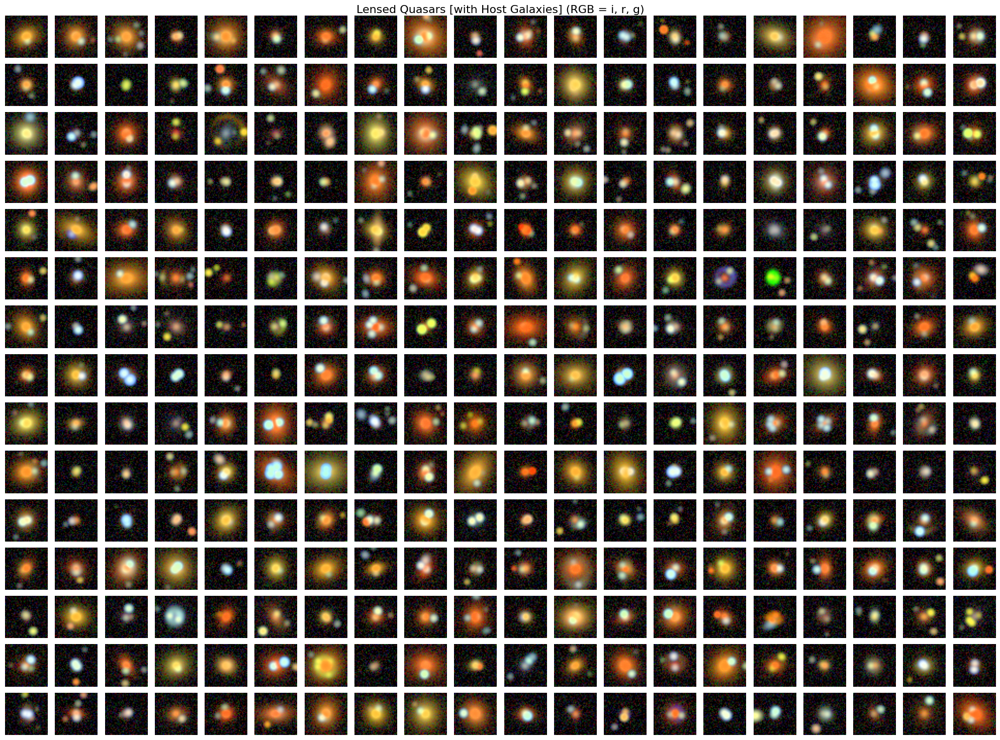

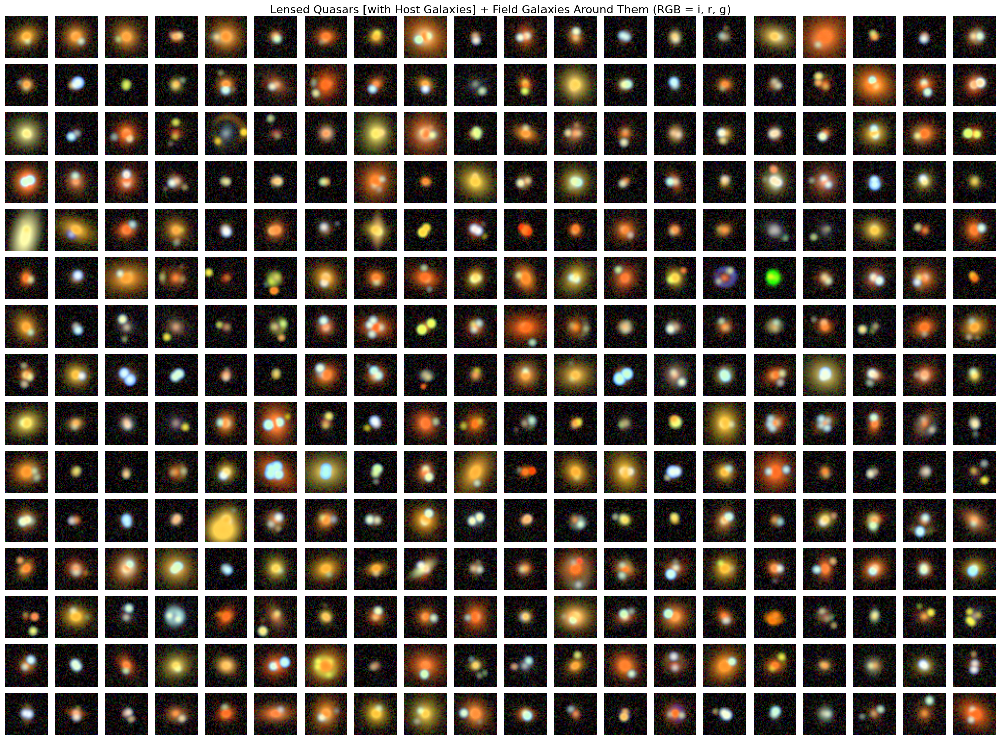

In [ ]:
# # Some images to visualize the generated lensed quasars
# from utils import plot_montage

# selected_lenses = lensed_quasars[300:600]  # Select lenses 300 to 600 for plotting

# plot_montage(selected_lenses, number_to_plot=300, num_cols=20, random_seed=42,
#             plot_title="Lensed Quasars [with Host Galaxies] (RGB = i, r, g)");

# # add field galaxies to the lenses and plot again
# selected_lenses_with_field_galaxies = selected_lenses.copy()  # Start with the original selected lenses
# for lens in selected_lenses_with_field_galaxies:
#     lens.add_field_galaxies(field_galaxies=field_galaxy_pop.draw_galaxies(area=Quantity(20, "arcsec2")))

# plot_montage(selected_lenses_with_field_galaxies, number_to_plot=300, num_cols=20, random_seed=42,
#             plot_title="Lensed Quasars [with Host Galaxies] + Field Galaxies Around Them (RGB = i, r, g)");